## This notebook is going to show the OLCI analysis

In [2]:
import xarray as xr
import hvplot.xarray
import hvplot.pandas
import cartopy.crs as crs
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import pandas as pd
import geopandas as gpd
import math

The goal of this notebook is to pull in OLCI chla and Rrs data and then use GOES SST data to delineate our frontal eddy and using that delineation pull out the Rrs data and see how the spectra changes across time in the eddy.

I could also seriously consider just a simple transect across the eddy and showing how that changes.

Promising times and scene IDs
- 2021-09-08T15:06:01.083433Z
  - S3B_OL_2_WFR____20210908T150601_20210908T150901_20210910T002357_0179_056_353_2340_MAR_O_NT_003
- 2021-09-06T14:56:40.180325Z
  - S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003
- 2021-09-05T15:22:51.229524Z
  - S3A_OL_2_WFR____20210905T152251_20210905T152551_20210907T035656_0179_076_068_2340_MAR_O_NT_003
- 2021-09-04T15:09:45.844880Z
  - S3B_OL_2_WFR____20210904T150946_20210904T151246_20210906T043354_0179_056_296_2340_MAR_O_NT_003
- 2021-08-31T15:13:30.521883Z
  - S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003
- 2021-08-27T15:17:15.136914Z
  - S3B_OL_2_WFR____20210827T151715_20210827T152015_20210829T034615_0179_056_182_2340_MAR_O_NT_003
- 2021-08-25T15:07:54.666991Z
  - S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003
- 2021-08-12T15:06:01.826509Z
  - S3B_OL_2_WFR____20210812T150602_20210812T150902_20210814T025047_0179_055_353_2340_MAR_O_NT_003
- 2021-08-09T15:22:53.064980Z
  - S3A_OL_2_WFR____20210809T152253_20210809T152553_20210811T032752_0179_075_068_2340_MAR_O_NT_003

 

    

First let's look at GOES

requested via http://coastwatch.pfeg.noaa.gov/erddap/griddap/jplStarG16SSTv270.nc?sea_surface_temperature%5B(2021-08-01):1:(2021-09-14T13:00:00Z)%5D%5B(38.01):1:(30.01)%5D%5B(-82.99):1:(-71.99)%5D

In [2]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_3377_b691_aa78.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:492: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [3]:
goes_ds

<xarray.Dataset>
Dimensions:                  (latitude: 401, longitude: 551, time: 1067)
Coordinates:
  * time                     (time) object 2021-08-01 00:00:00 ... 2021-09-14...
  * latitude                 (latitude) float32 38.01 37.99 ... 30.03 30.01
  * longitude                (longitude) float32 -82.99 -82.97 ... -72.01 -71.99
Data variables:
    sea_surface_temperature  (time, latitude, longitude) float32 ...
Attributes:
    acknowledgement:            Please acknowledge the use of these data with...
    cdm_data_type:              Grid
    col_count:                  5920
    col_start:                  2290
    comment:                    SSTs are a weighted average of the SSTs of co...
    Conventions:                CF-1.7, COARDS, ACDD-1.3
    creator_email:              Alex.Ignatov@noaa.gov
    creator_name:               Alex Ignatov
    creator_type:               person
    creator_url:                http://www.star.nesdis.noaa.gov
    date_created:               2019-05-02T23:19:39Z
    Easternmost_Easting:        -71.99
    gds_version_id:             02.0
    geospatial_lat_max:         38.01
    geospatial_lat_min:         30.01
    geospatial_lat_resolution:  0.02
    geospatial_lat_units:       degrees_north
    geospatial_lon_max:         -71.99
    geospatial_lon_min:         -82.99
    geospatial_lon_resolution:  0.02
    geospatial_lon_units:       degrees_east
    history:                    Created by the L2-to-L3 conversion tool,  whi...
    id:                         ABI_G16-STAR-L3C-v2.7
    infoUrl:                    https://podaac.jpl.nasa.gov/dataset/ABI_G16-S...
    institution:                NOAA/NESDIS/STAR
    keywords:                   abi, angle, atmosphere, atmospheric, bias, co...
    keywords_vocabulary:        GCMD Science Keywords
    license:                    GHRSST protocol describes data use as free an...
    metadata_link:              https://podaac.jpl.nasa.gov/ws/metadata/datas...
    naming_authority:           org.ghrsst
    Northernmost_Northing:      38.01
    platform:                   GOES-16
    processing_level:           L3C
    product_version:            L2 algorithm V2.70; L3 algorithm V4.2.6
    project:                    Group for High Resolution Sea Surface Tempera...
    publisher_email:            ghrsst-po@nceo.ac.uk
    publisher_name:             The GHRSST Project Office
    publisher_type:             group
    publisher_url:              https://www.ghrsst.org
    references:                 Data convention: GHRSST Data Specification (G...
    row_count:                  5920
    row_start:                  1540
    sensor:                     ABI
    source:                     l2p_source : 20220314160000-STAR-L2P_GHRSST-S...
    sourceUrl:                  https://thredds.jpl.nasa.gov/thredds/dodsC/Oc...
    Southernmost_Northing:      30.01
    spatial_resolution:         0.02 deg
    sst_luts:                   LUT_ABI_G16_L2C_DEPTH_DAYNIGHT_V01.06_2019042...
    standard_name_vocabulary:   CF Standard Name Table v70
    Sub_Lon:                    -75.0
    summary:                    Sea surface temperature retrievals produced b...
    testOutOfDate:              now-1day
    time_coverage_end:          2021-09-14T13:00:00Z
    time_coverage_start:        2021-08-01T00:00:00Z
    title:                      GOES-16 ABI L3C SST (ABI G16-STAR-L3C-v2.70),...
    Westernmost_Easting:        -82.99

In [432]:
goes_4h = goes_ds.sea_surface_temperature.resample(time='3H').mean(skipna=True)

In [10]:
goes_ds_subset = goes_ds.sel(time=slice('2021-08-20 00:00:00','2021-09-10 00:00:00'))

In [13]:
goes_ds_subset.time

<xarray.DataArray 'time' (time: 505)>
array([cftime.DatetimeGregorian(2021, 8, 20, 0, 0, 0, 0),
       cftime.DatetimeGregorian(2021, 8, 20, 1, 0, 0, 0),
       cftime.DatetimeGregorian(2021, 8, 20, 2, 0, 0, 0), ...,
       cftime.DatetimeGregorian(2021, 9, 9, 22, 0, 0, 0),
       cftime.DatetimeGregorian(2021, 9, 9, 23, 0, 0, 0),
       cftime.DatetimeGregorian(2021, 9, 10, 0, 0, 0, 0)], dtype=object)
Coordinates:
  * time     (time) object 2021-08-20 00:00:00 ... 2021-09-10 00:00:00
Attributes:
    _CoordinateAxisType:  Time
    actual_range:         [1.6277760e+09 1.6316244e+09]
    axis:                 T
    comment:              Seconds since 1981-01-01 00:00:00
    ioos_category:        Time
    long_name:            reference time of sst file
    standard_name:        time
    time_origin:          01-JAN-1970 00:00:00

In [11]:
goes_sst_mean = goes_ds_subset.sea_surface_temperature.mean('time', skipna=True)

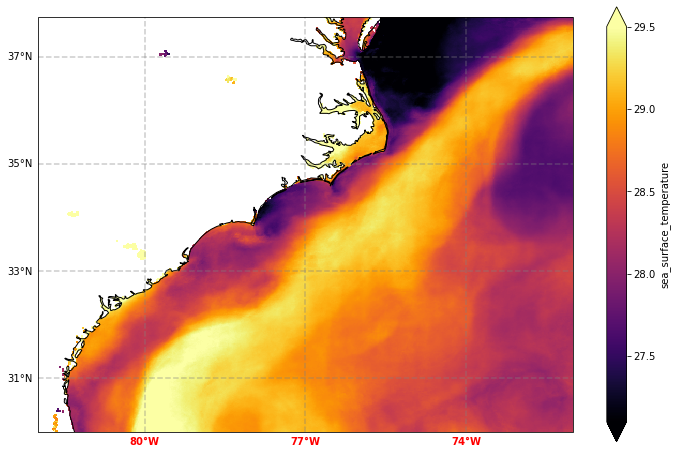

In [104]:
import matplotlib.ticker as mticker

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')
ax.set_ylim(30,37.75)
ax.set_xlim(-82,-72)
goes_sst_mean.plot(ax=ax,x='longitude', y='latitude', cmap ='inferno', vmin=27.1, vmax=29.5)

gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=1.5, color='gray', alpha=0.4, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-80, -77, -74])
gl.ylocator = mticker.FixedLocator([31, 33, 35, 37])
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 15, 'color': 'gray'}
gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

fig.savefig('goes_sst_mean_aug_sept.png',dpi=400)


plt.show()

In [12]:
goes_sst_mean.hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(26.5, 29.5), coastline=True, rasterize=True)

:DynamicMap   []
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (sea_surface_temperature)
      .Coastline.I :Feature   [Longitude,Latitude]

In [39]:
goes_ds_subset.sea_surface_temperature.hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(27.5, 29.5), coastline=True, rasterize=True)


:DynamicMap   [time]
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (sea_surface_temperature)
      .Coastline.I :Feature   [Longitude,Latitude]

#### Now pull in OLCI 

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


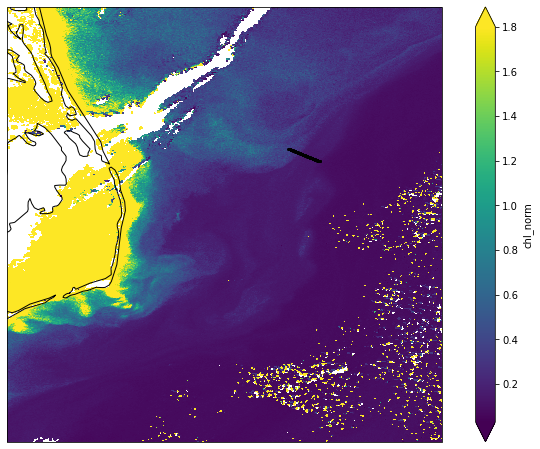

In [36]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.03, vmax=1.8), cmap='viridis')
df_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='black', alpha=1)
# fig.savefig('olci_chla_sept0614.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [4]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

Pull in OLCI data

Data downloaded from https://coda.eumetsat.int/#/home

scene id = S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003

In [3]:
import matplotlib 

matplotlib.rcParams.update({'font.size': 12})

In [7]:
# loading xarray datasets
ds = xr.open_dataset('data/olci/'+ folder +'/chl_oc4me.nc')
olci_geo_coords = xr.open_dataset('data/olci/'+ folder +'/geo_coordinates.nc')

# extracting coordinates
lat = olci_geo_coords.latitude.data
lon = olci_geo_coords.longitude.data

# assign coordinates to the chl dataset (needs to refer to both the dimensions of our dataset)
ds = ds.assign_coords({"lon":(["rows","columns"], lon), "lat":(["rows","columns"], lat)})


In [8]:
ds

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4091)
Coordinates:
    lon            (rows, columns) float64 -82.39 -82.39 ... -70.74 -70.73
    lat            (rows, columns) float64 41.98 41.98 41.98 ... 29.08 29.08
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 ...
    CHL_OC4ME_err  (rows, columns) float32 ...
Attributes:
    absolute_orbit_number:  17451
    ac_subsampling_factor:  64
    al_subsampling_factor:  1
    comment:                 
    contact:                ops@eumetsat.int
    creation_time:          2021-09-02T01:58:58Z
    history:                  2021-09-02T01:58:58Z: PUGCoreProcessor /data/ip...
    institution:            MAR
    netCDF_version:         4.2 of Jul  5 2012 17:07:43 $
    product_name:           S3B_OL_2_WFR____20210831T151331_20210831T151631_2...
    references:             S3IPF PDS 004.3 - i2r3 - Product Data Format Spec...
    resolution:             [ 270 294 ]
    source:                 IPF-OL-2 07.01
    start_time:             2021-08-31T15:13:30.541007Z
    stop_time:              2021-08-31T15:16:30.508724Z
    title:                  OLCI Level 2 WATER Product, OC4Me Chlorophyll con...

In [4]:
def get_olci_chla(fp):
    #open dataset in xarray
    nc_chl = xr.open_dataset('data/olci/'+ fp +'/chl_oc4me.nc') #path to chlorophyll file 

    n_coord =xr.open_dataset('data/olci/'+ fp +'/geo_coordinates.nc') #path to coordinates file

    #n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

    ds_grid = [[nc_chl], [n_coord]]

    combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
    combined #dataset with all but not recognizing coordinates

    olci_ds = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
    # this chla product is log transformed
    olci_ds['chl_norm'] = 10**olci_ds.CHL_OC4ME
    return(olci_ds)

In [138]:
#open dataset in xarray
folder = 'S3B_OL_2_WFR____20210908T150601_20210908T150901_20210910T002357_0179_056_353_2340_MAR_O_NT_003.SEN3'

nc_chl = xr.open_dataset('data/olci/'+ folder +'/chl_oc4me.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('data/olci/'+ folder +'/geo_coordinates.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds['chl_norm'] = 10**olci_ds.CHL_OC4ME
olci_ds 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4091)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

Clear eddy center via backtracking SST
time, lat, lon
2021-09-06 17:00:00, 35.44, -74.95
2021-09-05 23:00:00, 35.18, -75.12
2021-09-05 05:00:00, 34.95, -75.21
2021-09-04 18:00:00, 34.85, -75.25
2021-09-03 17:00:00, 34.61, -75.63
2021-08-31 02:00:00, 33.50, -76.21
2021-08-30 03:00:00, 33.16, -76.70
2021-08-29 02:00:00, 32.96, -76.65
2021-08-27 20:00:00, 32.70, -77.33
2021-08-25 20:00:00, 32.50, -78.12 # as of August 25th it doesn't seem to be visible but this is the approximate location of the meander that becomes the eddy 36 hours later

In [139]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') #* test_df.hvplot.points('lon', 'lat', geo=True)

:DynamicMap   []
   :Image   [lon,lat]   (CHL_OC4ME)

From here we'll make some xarray datasets to select across a certain lat and lon range

In [99]:
sept06_y_list = np.arange(35.51, 35.50, -0.002)
sept05_y_list = np.arange(35.14, 34.35, -0.002)
sept04_y_list = np.arange(35.08, 34.32, -0.002)
aug31_y_list = np.arange(34.48, 33.25, -0.002)
aug27_y_list = np.arange(33.43, 32.37, -0.002)
aug25_y_list = np.arange(33.52, 32.20, -0.002) 

In [100]:
sept06_x_list = np.arange(-75.44, -73.92, 0.002)
sept05_x_list = np.arange(-75.72, -74.52, 0.002)
sept04_x_list = np.arange(-75.94, -74.55, 0.002)
aug31_x_list = np.arange(-77.2, -75.5, 0.002)
aug27_x_list = np.arange(-78.69, -76.39, 0.002)
aug25_x_list = np.arange(-79.05, -77.36, 0.002)

In [101]:
sept04_x_list.shape

(696,)

In [102]:
def get_lat_lon(y_list, x_list):
    ratio = len(y_list)/len(x_list)
    lat_list = []
    lon_list = []

    for idx in range(len(x_list)):
    # for idx in range(300):

        lat = y_list[math.floor(idx*ratio)]
        lon = x_list[idx]
        lat_list.append(lat)
        lon_list.append(lon)
    return(list(zip(lat_list, lon_list)))
test_df= pd.DataFrame(get_lat_lon(sept06_y_list,sept06_x_list), columns=['lat', 'lon'])
test_df

,lat,lon
0,35.510,-75.440
1,35.510,-75.438
2,35.510,-75.436
3,35.510,-75.434
4,35.510,-75.432
...,...,...
755,35.502,-73.930
756,35.502,-73.928
757,35.502,-73.926
758,35.502,-73.924


In [11]:
len(aug25_x_list), len(aug25_y_list)
len(aug27_x_list), len(aug27_y_list)
len(aug31_x_list), len(aug31_y_list)

(851, 615)

In [12]:
def grab_transect_data(x_list, y_list, fp):
    olci_ds = get_olci_chla(fp)

    # I want to find the speed at a certain lat/lon point.
    lat_list = []
    lon_list = []
    chla_list = []
    xloc_list = []
    yloc_list = []

    ratio = len(y_list)/len(x_list)

    for idx in range(len(x_list)):
    # for idx in range(300):

        lat = y_list[math.floor(idx*ratio)]
        lon = x_list[idx]

        # First, find the index of the grid point nearest a specific lat/lon.   
        abslat = np.abs(olci_ds.lat-lat)
        abslon = np.abs(olci_ds.lon-lon)
        c = np.maximum(abslon, abslat)

        try:
            ([yloc], [xloc]) = np.where(c == np.min(c))

        except ValueError:
            # sometimes there are two equally near and I just grab the first one
            yloc = np.where(c == np.min(c))[0][0]
            xloc = np.where(c == np.min(c))[1][0]

        xloc_list.append(xloc)
        yloc_list.append(yloc)


        if idx % 50 == 0:
            print(idx)

        # Now I can use that index location to get the values at the x/y diminsion
        point_ds = olci_ds.sel(columns=xloc, rows=yloc)

        chla_list.append(point_ds.chl_norm.values)
        lat_list.append(point_ds.lat.values)
        lon_list.append(point_ds.lon.values)

    return(xloc_list, yloc_list, chla_list, lat_list, lon_list)


In [13]:
aug25_xloc_list, aug25_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(aug25_x_list, aug25_y_list,
    'S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800


In [14]:
aug27_xloc_list, aug27_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(aug27_x_list, aug27_y_list,
    'S3B_OL_2_WFR____20210827T151715_20210827T152015_20210829T034615_0179_056_182_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100


In [15]:
aug31_xloc_list, aug31_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(aug31_x_list, aug31_y_list,
    'S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850


In [16]:
sept04_xloc_list, sept04_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(sept04_x_list, sept04_y_list,
    'S3B_OL_2_WFR____20210904T150946_20210904T151246_20210906T043354_0179_056_296_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600
650


In [52]:
sept05_xloc_list, sept05_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(sept05_x_list, sept05_y_list,
    'S3A_OL_2_WFR____20210905T152251_20210905T152551_20210907T035656_0179_076_068_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600


In [104]:
sept06_xloc_list, sept06_yloc_list, chla_list, lat_list, lon_list = grab_transect_data(sept06_x_list, sept06_y_list,
    'S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003.SEN3')

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750


In [105]:
df = pd.DataFrame(list(zip(lat_list,lon_list)), columns=['lat', 'lon'])

df['olci_chla'] = [float(x) for x in chla_list]

points_gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))

Don't auto run

Aug 25th

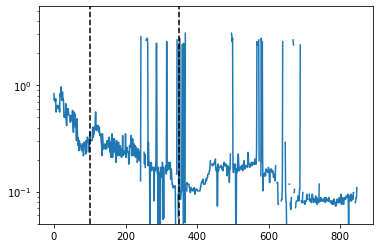

In [20]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(200, c='k', ls='--')
plt.axvline(700, c='k', ls='--')
plt.ylim(0.05,5.5)
plt.yscale('log')

Aug 27th

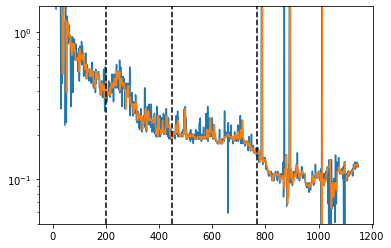

In [62]:
plt.plot(points_gdf.olci_chla)
plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(200, c='k', ls='--')
plt.axvline(450, c='k', ls='--')
plt.axvline(770, c='k', ls='--')
plt.ylim(0.05,1.5)
plt.yscale('log')

Aug 31st

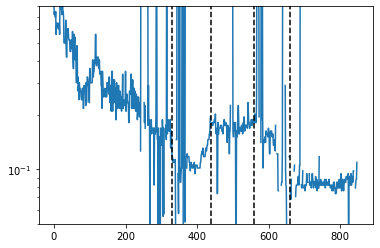

In [47]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(330, c='k', ls='--')

plt.axvline(440, c='k', ls='--')
plt.axvline(560, c='k', ls='--')
plt.axvline(660, c='k', ls='--')
plt.ylim(0.05,.8)
plt.yscale('log')

Sept 4th

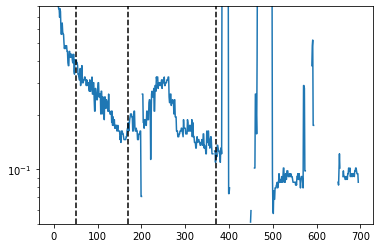

In [98]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(50, c='k', ls='--')
plt.axvline(170, c='k', ls='--')
plt.axvline(370, c='k', ls='--')
plt.ylim(0.05,.8)
plt.yscale('log')

Sept 5th

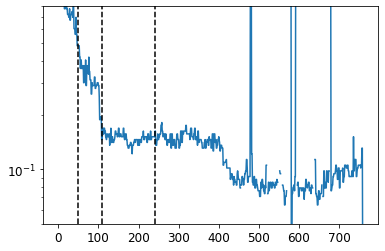

In [109]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(50, c='k', ls='--') # coastal
plt.axvline(110, c='k', ls='--') # pre-eddy
plt.axvline(240, c='k', ls='--') # end of eddy
plt.ylim(0.05,.8)
plt.yscale('log')

Sept 6th

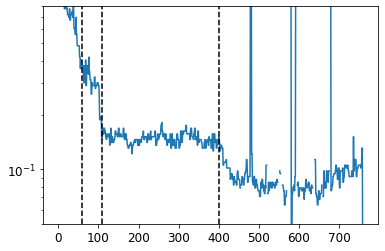

In [116]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(60, c='k', ls='--') # coastal
plt.axvline(110, c='k', ls='--') # pre-eddy
plt.axvline(400, c='k', ls='--') # end of eddy
plt.ylim(0.05,.8)
plt.yscale('log')

(-80.0, -74.0)

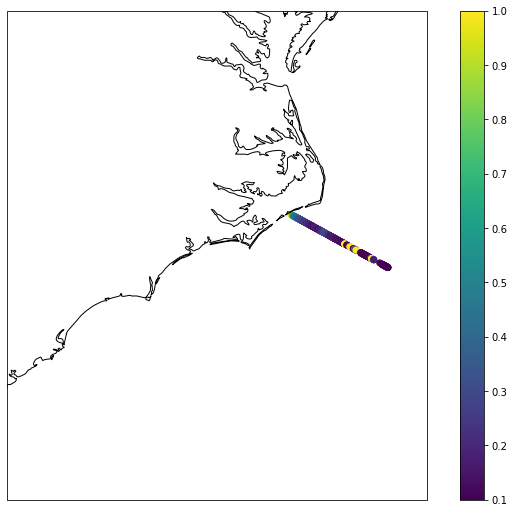

In [88]:
fig, ax = plt.subplots(figsize=(12,9), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
points_gdf.plot(column='olci_chla', legend=True, ax=ax, vmin=0.1,vmax=1)
ax.set_ylim(31,38)
ax.set_xlim(-80,-74)

In [23]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.hvplot.points('lon', 'lat', geo=True)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

now see how bands respond

In [117]:
def grab_olci_bands(fp):
    # fp = 'S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003.SEN3'
    #open dataset in xarray
    nc_band1 = xr.open_dataset('data/olci/' + fp + '/Oa01_reflectance.nc') #path to chlorophyll file 
    nc_band2 = xr.open_dataset('data/olci/' + fp + '/Oa02_reflectance.nc') #path to chlorophyll file 
    nc_band3 = xr.open_dataset('data/olci/' + fp + '/Oa03_reflectance.nc') #path to chlorophyll file 
    nc_band4 = xr.open_dataset('data/olci/' + fp + '/Oa04_reflectance.nc') #path to chlorophyll file 
    nc_band5 = xr.open_dataset('data/olci/' + fp + '/Oa05_reflectance.nc') #path to chlorophyll file 
    nc_band6 = xr.open_dataset('data/olci/' + fp + '/Oa06_reflectance.nc') #path to chlorophyll file 
    nc_band7 = xr.open_dataset('data/olci/' + fp + '/Oa07_reflectance.nc') #path to chlorophyll file 
    nc_band8 = xr.open_dataset('data/olci/' + fp + '/Oa08_reflectance.nc') #path to chlorophyll file 
    nc_band9 = xr.open_dataset('data/olci/' + fp + '/Oa09_reflectance.nc') #path to chlorophyll file 
    nc_band10 = xr.open_dataset('data/olci/' + fp + '/Oa10_reflectance.nc') #path to chlorophyll file 
    nc_band11 = xr.open_dataset('data/olci/' + fp + '/Oa11_reflectance.nc') #path to chlorophyll file 

    n_coord =xr.open_dataset('data/olci/' + fp + '/geo_coordinates.nc') #path to coordinates file

    #n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

    ds_grid = [[nc_band1],[nc_band2],[nc_band3],[nc_band4],[nc_band5],[nc_band6],[nc_band7],[nc_band8],[nc_band9],[nc_band10],[nc_band11], [n_coord]]

    combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
    combined #dataset with all but not recognizing coordinates

    olci_ds_bands = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
    # this chla product is log transformed
    return(olci_ds_bands)

In [118]:
olci_ds_bands = grab_olci_bands('S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003.SEN3')

df= pd.DataFrame(get_lat_lon(sept06_y_list,sept06_x_list), columns=['lat', 'lon'])


olci_ds_bands.Oa03_reflectance.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(0,0.04), rasterize=True, cmap='jet') * df.hvplot.points('lon', 'lat', geo=True)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (Oa03_reflectance)
      .Points.I :Points   [lon,lat]

In [18]:
def grab_rrs_from_ds(xloc_list, yloc_list, olci_ds_bands):
    band_names = ['Oa01_reflectance','Oa02_reflectance','Oa03_reflectance','Oa04_reflectance','Oa05_reflectance','Oa06_reflectance',
                 'Oa07_reflectance','Oa08_reflectance','Oa09_reflectance','Oa10_reflectance', 'Oa11_reflectance']
    
    olci_reflectance = []
    olci_reflectance_up = []
    olci_reflectance_down = []
    for i in range(len(xloc_list)):
        point_ds = olci_ds_bands.sel(columns=xloc_list[i], rows=yloc_list[i])
        spectra = []
        for band in band_names:
            spectra.append(float(point_ds[band].values))
        olci_reflectance.append(spectra)
        
        point_ds = olci_ds_bands.sel(columns=xloc_list[i], rows=yloc_list[i]+3)
        spectra = []
        for band in band_names:
            spectra.append(float(point_ds[band].values))
        olci_reflectance_up.append(spectra)
        
        point_ds = olci_ds_bands.sel(columns=xloc_list[i], rows=yloc_list[i]-3)
        spectra = []
        for band in band_names:
            spectra.append(float(point_ds[band].values))
        olci_reflectance_down.append(spectra)
        
        if i % 50 == 0:
            print(i)
        
    olci_reflectance_up = np.array(olci_reflectance_up)
    olci_reflectance = np.array(olci_reflectance)
    olci_reflectance_down = np.array(olci_reflectance_down)
    
    olci_rrs_cube = np.array([olci_reflectance_up,olci_reflectance,olci_reflectance_down])
    
    
    # cleaning the cube based on the variability of 445nm with nearby pixels
    cleaned_rrs = []
    for i in range(olci_reflectance.shape[0]):
        if abs(olci_reflectance[i,2]-olci_reflectance_up[i,2]) > 0.002:
            cleaned_rrs.append(np.array([np.nan]*11))
        elif abs(olci_reflectance[i,2]-olci_reflectance_down[i,2]) > 0.002:
            cleaned_rrs.append(np.array([np.nan]*11))
        else:
            cleaned_rrs.append((olci_reflectance[i]+olci_reflectance_up[i]+olci_reflectance_down[i])/3)
    cleaned_rrs = np.array(cleaned_rrs)

    return(olci_rrs_cube, cleaned_rrs)

In [19]:
def just_clean_rrs(rrs_cube, threshold=0.002, just_mean=False):
    # cleaning the cube based on the variability of 445nm with nearby pixels
    cleaned_rrs = []
    for i in range(rrs_cube.shape[1]):
        if just_mean:
            cleaned_rrs.append((rrs_cube[0,i]+rrs_cube[1,i]+rrs_cube[2,i])/3)
        elif abs(rrs_cube[1,i,2]-rrs_cube[0,i,2]) > threshold:
            cleaned_rrs.append(np.array([np.nan]*11))
        elif abs(rrs_cube[1,i,2]-rrs_cube[2,i,2]) > threshold:
            cleaned_rrs.append(np.array([np.nan]*11))
        else: # take the mean of the three
            cleaned_rrs.append((rrs_cube[0,i]+rrs_cube[1,i]+rrs_cube[2,i])/3)
    cleaned_rrs = np.array(cleaned_rrs)
    return(cleaned_rrs)

In [20]:
olci_ds_bands = grab_olci_bands('S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003.SEN3')
aug25_olci_rrs_cube, aug25_cleaned_rrs = grab_rrs_from_ds(aug25_xloc_list, aug25_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800


In [21]:
olci_ds_bands = grab_olci_bands('S3B_OL_2_WFR____20210827T151715_20210827T152015_20210829T034615_0179_056_182_2340_MAR_O_NT_003.SEN3')
aug27_olci_rrs_cube, aug27_cleaned_rrs = grab_rrs_from_ds(aug27_xloc_list, aug27_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100


In [22]:
olci_ds_bands = grab_olci_bands('S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003.SEN3')
aug31_olci_rrs_cube, aug31_cleaned_rrs = grab_rrs_from_ds(aug31_xloc_list, aug31_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850


In [23]:
olci_ds_bands = grab_olci_bands('S3B_OL_2_WFR____20210904T150946_20210904T151246_20210906T043354_0179_056_296_2340_MAR_O_NT_003.SEN3')
sept04_olci_rrs_cube, sept04_cleaned_rrs = grab_rrs_from_ds(sept04_xloc_list, sept04_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600
650


In [60]:
olci_ds_bands = grab_olci_bands('S3A_OL_2_WFR____20210905T152251_20210905T152551_20210907T035656_0179_076_068_2340_MAR_O_NT_003.SEN3')
sept05_olci_rrs_cube, sept05_cleaned_rrs = grab_rrs_from_ds(sept05_xloc_list, sept05_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600


In [119]:
olci_ds_bands = grab_olci_bands('S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003.SEN3')
sept06_olci_rrs_cube, sept06_cleaned_rrs = grab_rrs_from_ds(sept06_xloc_list, sept06_yloc_list, olci_ds_bands)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750


In [120]:
wavelengths = np.array([400,412.5,442.5,490,510,560,620,665,673.75,681.25,708.75])

(0.0, 0.05)

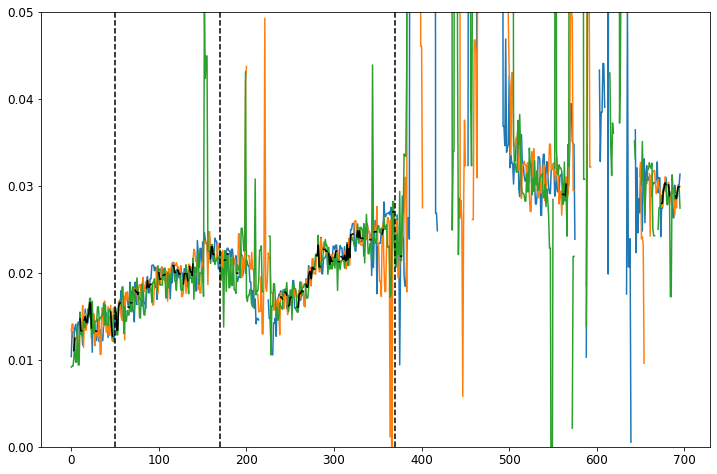

In [160]:
# aug25_cleaned_rrs_mod = just_clean_rrs(aug25_olci_rrs_cube, threshold=0.01, just_mean=False)
fig, ax = plt.subplots(figsize=(12,8))
plt.plot(sept04_olci_rrs_cube[0,:,2])
plt.plot(sept04_olci_rrs_cube[1,:,2])
plt.plot(sept04_olci_rrs_cube[2,:,2])

plt.plot(sept04_cleaned_rrs[:,2], color='black')

# august 25th
# plt.axvline(200, c='k', ls='--')
# plt.axvline(700, c='k', ls='--')

# august 27th
# plt.axvline(200, c='k', ls='--')
# plt.axvline(450, c='k', ls='--')
# plt.axvline(770, c='k', ls='--')

# august 31st
# plt.axvline(330, c='k', ls='--')
# plt.axvline(440, c='k', ls='--')
# plt.axvline(560, c='k', ls='--')

# sept 4th
plt.axvline(50, c='k', ls='--')
plt.axvline(170, c='k', ls='--')
plt.axvline(370, c='k', ls='--')

# sept 5th
# plt.axvline(50, c='k', ls='--') # coastal
# plt.axvline(110, c='k', ls='--') # pre-eddy
# plt.axvline(240, c='k', ls='--') # end of eddy

# sept 6th
# plt.axvline(60, c='k', ls='--') # coastal
# plt.axvline(110, c='k', ls='--') # pre-eddy
# plt.axvline(400, c='k', ls='--') # end of eddy

plt.ylim(0.0,0.05)
# plt.yscale('log')

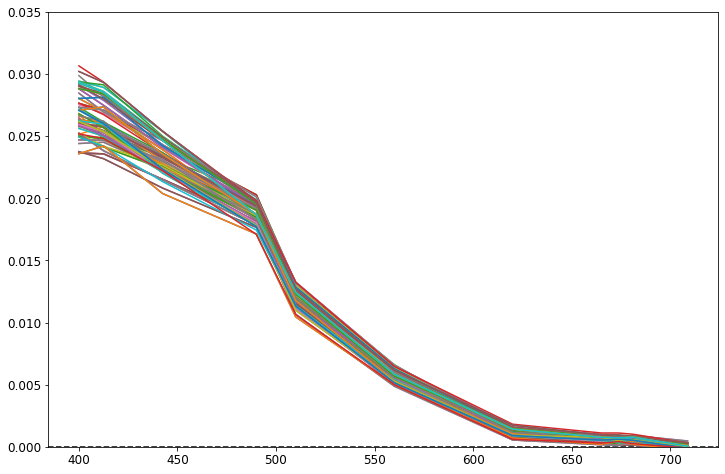

In [128]:
fig, ax = plt.subplots(figsize=(12,8))
ax.axhline(0, c='k', ls='--')

ax.plot(wavelengths, sept06_cleaned_rrs[110:400,:].T)
ax.set_ylim(0,0.035)
plt.show()

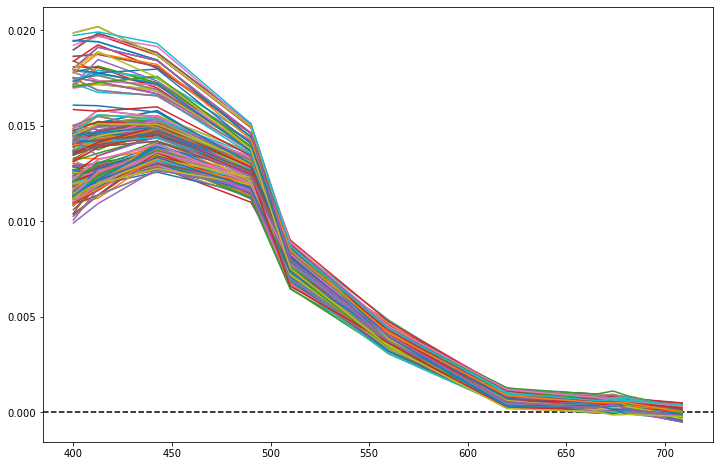

In [75]:
fig, ax = plt.subplots(figsize=(12,8))
ax.axhline(0, c='k', ls='--')

ax.plot(wavelengths, cleaned_data[450:770,:].T)
ax.set_ylim(0,0.028)
plt.show()

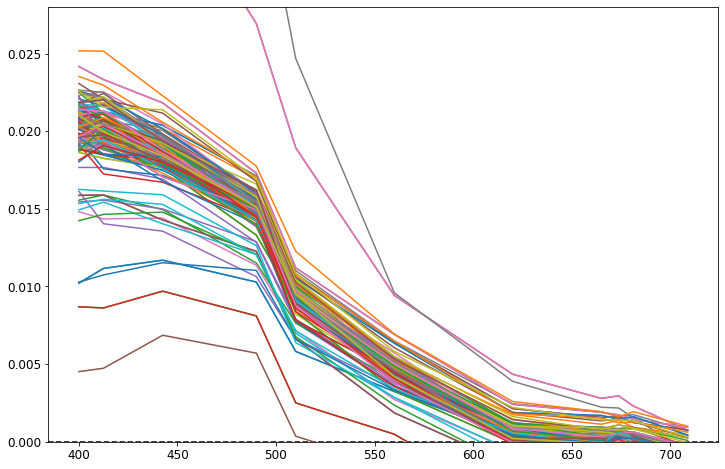

In [272]:
fig, ax = plt.subplots(figsize=(12,8))
ax.axhline(0, c='k', ls='--')

ax.plot(wavelengths, olci_reflectance[450:620,:].T)
ax.set_ylim(0,0.028)
plt.show()

This August 25th data was somewhat questionable, there was a ton of variability due to what I think is some really think clouds or atmospheric haze

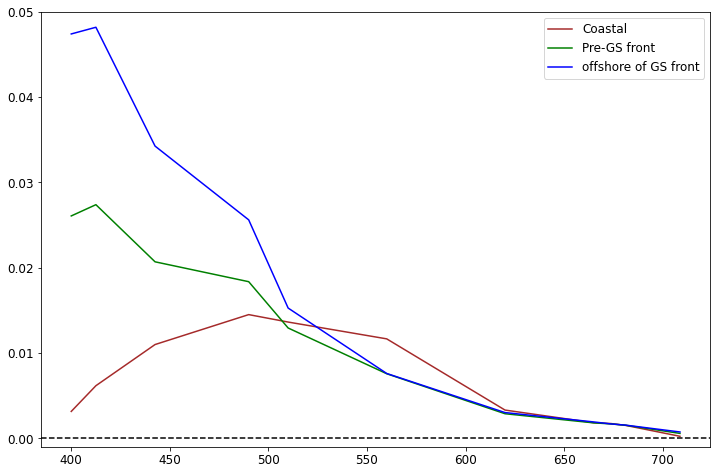

In [187]:
fig, ax = plt.subplots(figsize=(12,8))
# ax.plot(wavelengths, np.nanmedian(aug25_olci_reflectance[450:750,:],axis=0), label='Eddy', color='k', lw=5)

aug25_cleaned_rrs = just_clean_rrs(aug25_olci_rrs_cube, threshold=0.002, just_mean=True)



ax.plot(wavelengths, np.nanmedian(aug25_cleaned_rrs[:int(200),:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(aug25_cleaned_rrs[int(200):int(700),:],axis=0), label='Pre-GS front', color='green')
ax.plot(wavelengths, np.nanmedian(aug25_cleaned_rrs[int(700):,:],axis=0), label='offshore of GS front', color='blue')



ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.050)
plt.savefig('olci_eddy_250821.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

Aug 27th

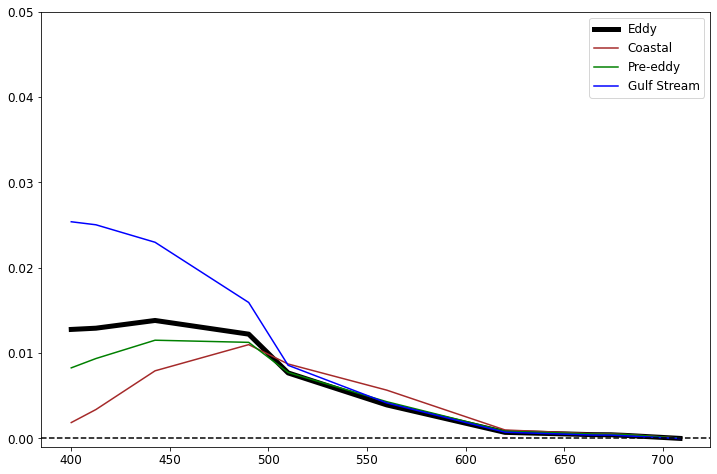

In [186]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[450:770,:],axis=0), label='Eddy', color='k', lw=5)


ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[:200,:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[200:450,:],axis=0), label='Pre-eddy', color='green')
# ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[770:,:],axis=0), label='offshore of eddy', color='teal')
ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[660:,:],axis=0), label='Gulf Stream', color='blue')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.05)
plt.savefig('olci_eddy_270821.png',dpi=450)
plt.show()

In [138]:
aug31_cleaned_rrs.shape

(851, 11)

In [139]:
cleaned_rrs.shape

(851, 11)

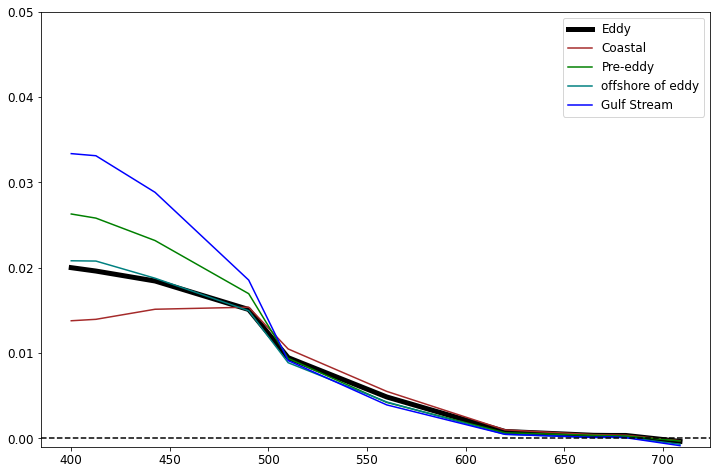

In [185]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[440:560,:],axis=0), label='Eddy', color='k', lw=5)


ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[:330,:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[330:440,:],axis=0), label='Pre-eddy', color='green')
ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[560:660,:],axis=0), label='offshore of eddy', color='teal')
ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[660:,:],axis=0), label='Gulf Stream', color='blue')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.050)
plt.savefig('olci_eddy_310821.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

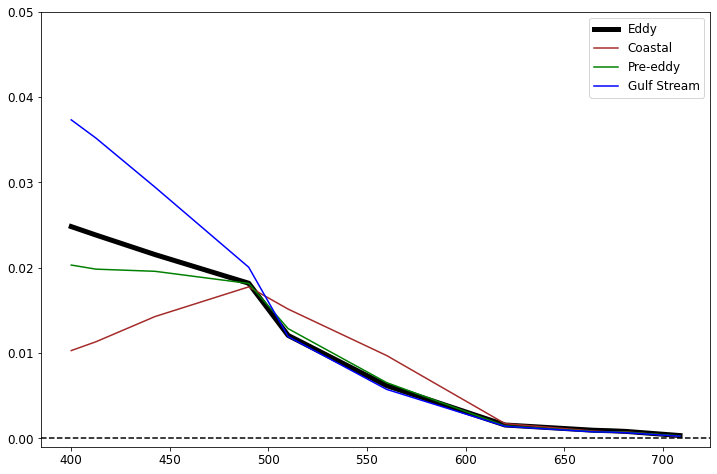

In [184]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(sept04_cleaned_rrs[170:370,:],axis=0), label='Eddy', color='k', lw=5)

# plt.axvline(50, c='k', ls='--')
# plt.axvline(170, c='k', ls='--')
# plt.axvline(370, c='k', ls='--')

ax.plot(wavelengths, np.nanmedian(sept04_cleaned_rrs[:50,:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(sept04_cleaned_rrs[50:170,:],axis=0), label='Pre-eddy', color='green')
# ax.plot(wavelengths, np.nanmedian(cleaned_rrs[560:,:],axis=0), label='offshore of eddy', color='teal')
ax.plot(wavelengths, np.nanmedian(sept04_cleaned_rrs[370:,:],axis=0), label='Gulf Stream', color='blue')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.05)
plt.savefig('olci_eddy_040921.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

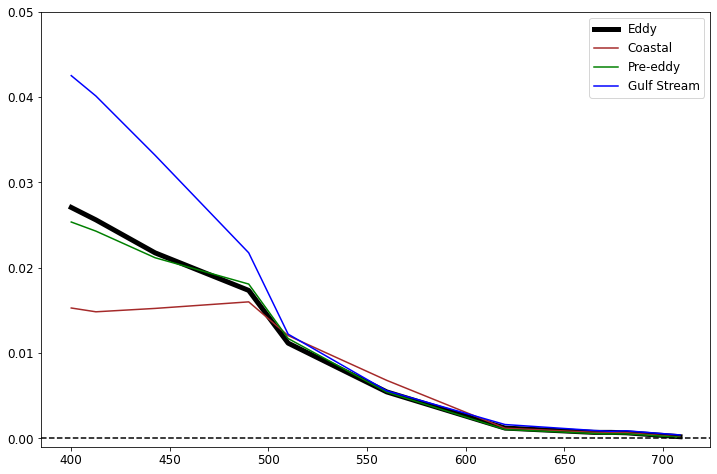

In [183]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(sept05_cleaned_rrs[110:240,:],axis=0), label='Eddy', color='k', lw=5)

# plt.axvline(50, c='k', ls='--')
# plt.axvline(170, c='k', ls='--')
# plt.axvline(370, c='k', ls='--')

ax.plot(wavelengths, np.nanmedian(sept05_cleaned_rrs[:50,:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(sept05_cleaned_rrs[50:110,:],axis=0), label='Pre-eddy', color='green')
# ax.plot(wavelengths, np.nanmedian(cleaned_rrs[560:,:],axis=0), label='offshore of eddy', color='teal')
ax.plot(wavelengths, np.nanmedian(sept05_cleaned_rrs[260:400,:],axis=0), label='Gulf Stream', color='blue')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.05)

plt.savefig('olci_eddy_050921.png',dpi=450)
plt.show()

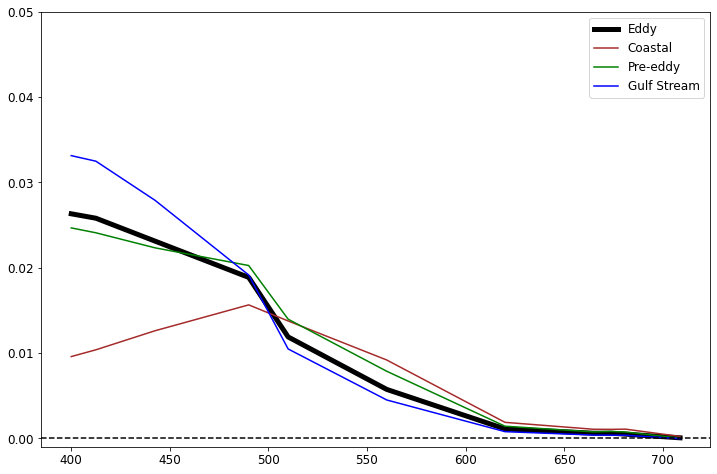

In [182]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(sept06_cleaned_rrs[110:400,:],axis=0), label='Eddy', color='k', lw=5)

# plt.axvline(60, c='k', ls='--') # coastal
# plt.axvline(110, c='k', ls='--') # pre-eddy
# plt.axvline(400, c='k', ls='--') # end of eddy

ax.plot(wavelengths, np.nanmedian(sept06_cleaned_rrs[:60,:],axis=0), label='Coastal', color='brown')
ax.plot(wavelengths, np.nanmedian(sept06_cleaned_rrs[60:110,:],axis=0), label='Pre-eddy', color='green')
# ax.plot(wavelengths, np.nanmedian(cleaned_rrs[560:,:],axis=0), label='offshore of eddy', color='teal')
ax.plot(wavelengths, np.nanmedian(sept06_cleaned_rrs[400:,:],axis=0), label='Gulf Stream', color='blue')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.05)

plt.savefig('olci_eddy_060921.png',dpi=450)
plt.show()

Show the eddy spectra change over time

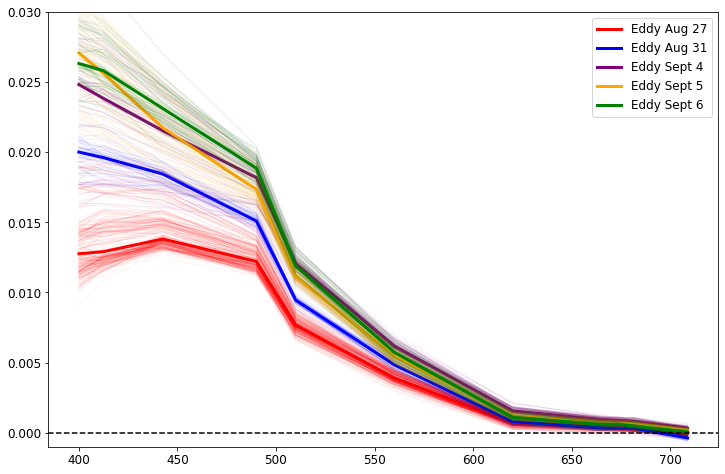

In [181]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(wavelengths, np.nanmedian(aug27_cleaned_rrs[450:770,:],axis=0), label='Eddy Aug 27', color='red', lw=3)
ax.plot(wavelengths, aug27_cleaned_rrs[450:770,:].T, color='red', lw=1, alpha=0.05)

ax.plot(wavelengths, np.nanmedian(aug31_cleaned_rrs[440:560,:],axis=0), label='Eddy Aug 31', color='blue', lw=3)
ax.plot(wavelengths, aug31_cleaned_rrs[440:560,:].T, color='blue', lw=1, alpha=0.05)

ax.plot(wavelengths, np.nanmedian(sept04_cleaned_rrs[170:370,:],axis=0), label='Eddy Sept 4', color='purple', lw=3)
ax.plot(wavelengths, sept04_cleaned_rrs[170:370,:].T, color='purple', lw=1, alpha=0.05)

ax.plot(wavelengths, np.nanmedian(sept05_cleaned_rrs[110:240,:],axis=0), label='Eddy Sept 5', color='orange', lw=3)
ax.plot(wavelengths, sept05_cleaned_rrs[110:240,:].T,  color='orange', lw=1, alpha=0.05)

ax.plot(wavelengths, np.nanmedian(sept06_cleaned_rrs[110:400,:],axis=0), label='Eddy Sept 6', color='green', lw=3)
ax.plot(wavelengths, sept06_cleaned_rrs[110:400,:].T,  color='green', lw=1, alpha=0.05)


ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.03)
# plt.savefig('olci_eddy_spectra_comparison_spread.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

Show a couple wavelengths through time

In [172]:
wavelengths[4]

510.0

In [125]:
from datetime import date
date.fromisoformat('2019-12-04')

datetime.date(2019, 12, 4)

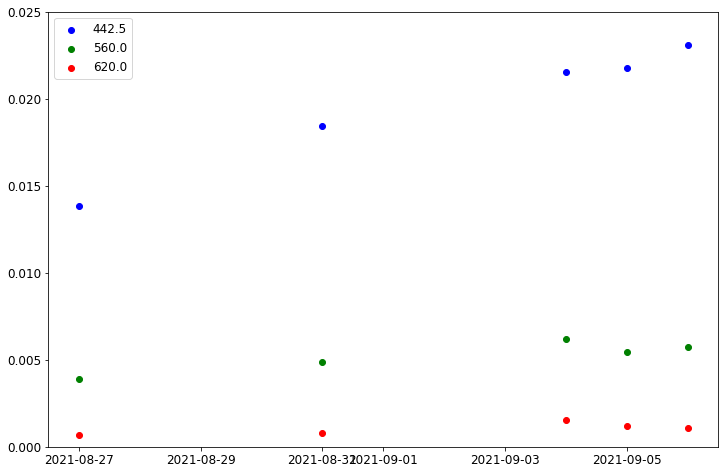

In [177]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['blue', 'green', 'red']

for idx,i in enumerate([2,5,6]):
    ax.scatter(date.fromisoformat('2021-09-04'), np.nanmedian(sept04_cleaned_rrs[170:370,i]), label=wavelengths[i], color=colors[idx])
#     ax.scatter(date.fromisoformat('2021-09-04'), sept04_cleaned_rrs[170:370,i], color=colors[idx], lw=1, alpha=0.05)

    ax.scatter(date.fromisoformat('2021-08-31'), np.nanmedian(aug31_cleaned_rrs[440:560,i],axis=0), color=colors[idx])
#     ax.scatter(date.fromisoformat('2021-08-31'), aug31_cleaned_rrs[440:560,i], color=colors[idx], lw=1, alpha=0.05)
    
    ax.scatter(date.fromisoformat('2021-08-27'), np.nanmedian(aug27_cleaned_rrs[450:770,i]), color=colors[idx])
    # ax.plot(wavelengths, aug27_cleaned_rrs[450:770,:].T, color='red', lw=1, alpha=0.05)

    ax.scatter(date.fromisoformat('2021-09-05'), np.nanmedian(sept05_cleaned_rrs[110:240,i]), color=colors[idx])
    # ax.plot(wavelengths, sept05_cleaned_rrs[110:240,:].T,  color='k', lw=1, alpha=0.05)

    ax.scatter(date.fromisoformat('2021-09-06'), np.nanmedian(sept06_cleaned_rrs[110:400,i]), color=colors[idx])
    # ax.plot(wavelengths, sept05_cleaned_rrs[110:240,:].T,  color='k', lw=1, alpha=0.05)


ax.legend()
# ax.axhline(0, c='k', ls='--')

ax.set_ylim(0.0,0.025)
plt.savefig('olci_eddy_rrs_through_time.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

Show the transects over time as the eddy moves closer and further from shore

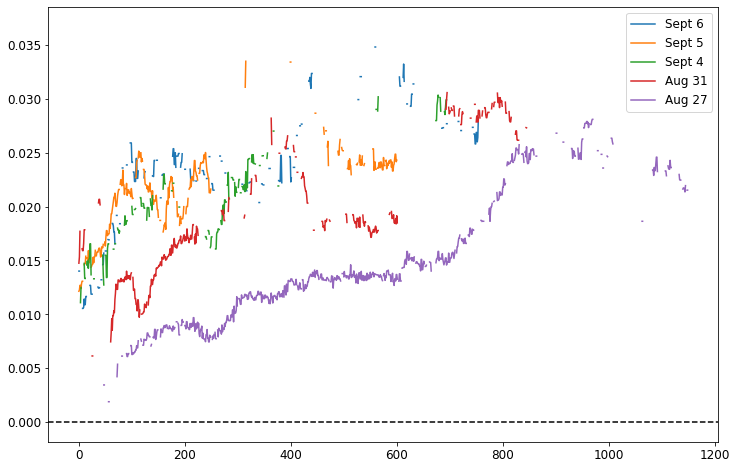

In [165]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(range(len(sept06_cleaned_rrs[:,2])),sept06_cleaned_rrs[:,2], label='Sept 6')
ax.plot(range(len(sept05_cleaned_rrs[:,2])),sept05_cleaned_rrs[:,2], label='Sept 5')
ax.plot(range(len(sept04_cleaned_rrs[:,2])),sept04_cleaned_rrs[:,2], label='Sept 4')
ax.plot(range(len(aug31_cleaned_rrs[:,2])),aug31_cleaned_rrs[:,2], label='Aug 31')
ax.plot(range(len(aug27_cleaned_rrs[:,2])),aug27_cleaned_rrs[:,2], label='Aug 27')

# plt.axvline(50, c='k', ls='--')
# plt.axvline(170, c='k', ls='--')
# plt.axvline(370, c='k', ls='--')

ax.legend()
ax.axhline(0, c='k', ls='--')

# ax.set_ylim(-0.001,0.04)
# plt.savefig('olci_eddy_040921.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()